In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:75% !important; }</style>"))

# Supervised Learning for PDs

<img src="dcr.png" alt="title1" width="1150"/>

# Setup

In [3]:
import warnings; warnings.simplefilter('ignore')
from dcr import *
%matplotlib inline

plt.rcParams['figure.dpi'] = 100
plt.rcParams['figure.figsize'] = (5, 3)
plt.rcParams.update({'font.size': 12})

# Synopsis

- Machine Learning "Stand-Alone" Techniques for Defaults
- Extension to "Ensembles" later
- Methods
    - Logistic Regression
    - K-Nearest Neighbors
    - Naive Bayes
    - Decision Trees 
    - Support Vector Machines
- Neural Networks and Deep Learning in separate chapter

# Data Preparation

In [4]:
from dcr import *
data = data.query('time <=40').copy()

_, data_train, data_test, X_train_scaled, X_test_scaled, y_train, y_test = dataprep(data, depvar='default_time', splitvar='time', threshold=26)

Include 11 scaled features in the following order:

 - Liquidity (`cep_time`)
 - Equity (`equity_time`)
 - Loan contract rate (`equity_time`)
 - FICO credit score (`FICO_orig_time`)
 - GDP growth rate (`gdp_time`)
 - Principal component 1 (`PCA1_1`)
 - Principal component 2 (`PCA2_1`)
 - Principal component 3 (`PCA3_1`)
 - Principal component 4 (`PCA4_1`)
 - Principal component 5 (`PCA5_1`)
 - Cluster 1 (`cluster_1`)


In [5]:
print('Observations in train data: ', X_train_scaled.shape)
print('Observations in test data: ', X_test_scaled.shape)
print('Default rate in train data: ', np.mean(y_train).round(4))
print('Default rate in test data: ', np.mean(y_test).round(4))

Observations in train data:  (12702, 11)
Observations in test data:  (27368, 11)
Default rate in train data:  0.0104
Default rate in test data:  0.0355


# Logistic Regression

## Classical Logistic Regression 

3 general main steps in `scikit-learn` for supervised learning:

 1. Instigate a model: select a model as an object/'estimator'
 2. Fit the model
 3. Evaluate the model: Compute predictions, scores, performance measures (here using our `validation` function)

In [6]:
# Step 1: Select a model
model_lr = LogisticRegression(penalty='none', fit_intercept=True, solver='saga', tol =1e-15, max_iter=15000)

# Step 2: Fit the model
model_lr.fit(X_train_scaled, y_train)

print('Coefficients:', model_lr.coef_.round(decimals=4))
print('Intercept:', model_lr.intercept_.round(decimals=4))

Coefficients: [[-0.2817 -0.2565  0.2965 -0.8004  0.0186 -0.0263  0.09    0.0147 -0.0978
  -0.056   0.2978]]
Intercept: [-5.2851]


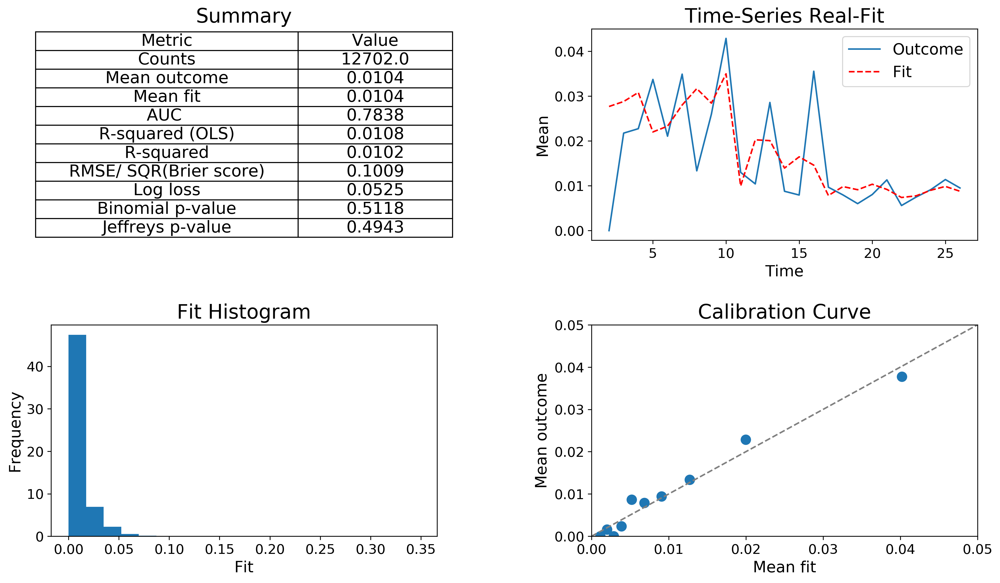

In [7]:
# Step 3: Compute predictions, scores, performance measures etc.
predictions_train = model_lr.predict_proba(X_train_scaled)[:,1].T

validation(predictions_train, y_train, data_train['time'].values)

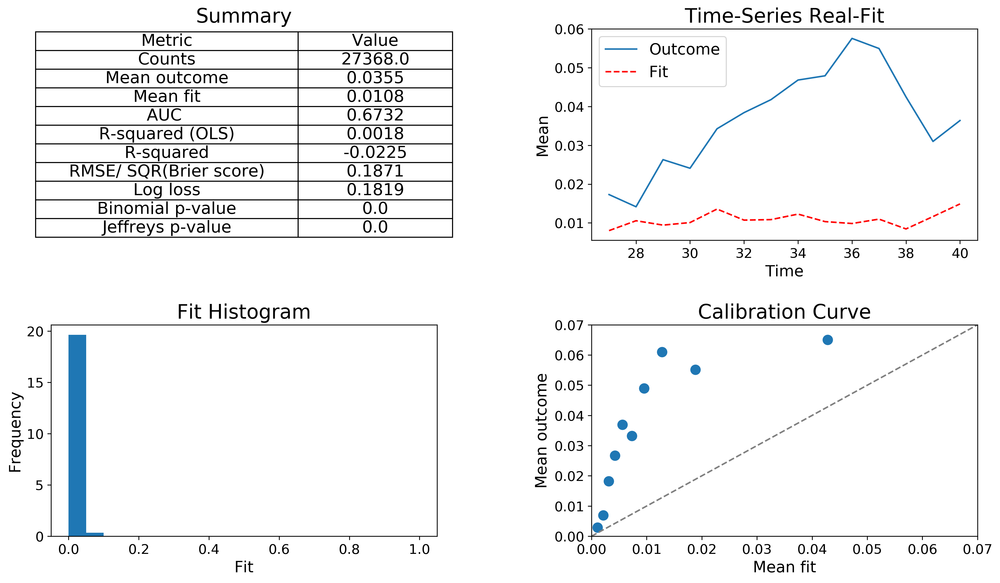

In [8]:
predictions_test = model_lr.predict_proba(X_test_scaled)[:,1].T

validation(predictions_test, y_test, data_test['time'].values)

## Logistic Regression with Regularization

In [9]:
model_lr_reg1 = LogisticRegression(penalty='l2', fit_intercept=True, C=0.1, solver='saga', tol =1e-15, max_iter=3000)
model_lr_reg1.fit(X_train_scaled, y_train)

print('Coefficients:', model_lr_reg1.coef_.round(decimals=4))
print('Intercept:', model_lr_reg1.intercept_.round(decimals=4))
      
predictions_reg1 = model_lr_reg1.predict_proba(X_train_scaled)

print('Log Loss:', log_loss(y_train, predictions_reg1).round(4))

Coefficients: [[-0.2353 -0.2207  0.3022 -0.7199  0.0297 -0.0486  0.0125  0.0322 -0.0812
  -0.0576  0.0706]]
Intercept: [-5.0682]
Log Loss: 0.0525


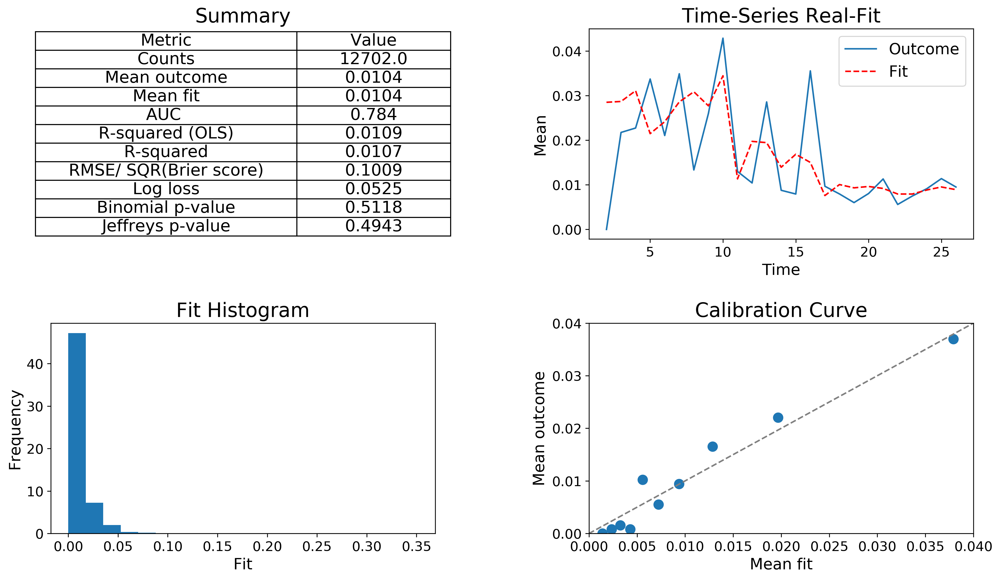

In [10]:
predictions_train = model_lr_reg1.predict_proba(X_train_scaled)[:,1].T

validation(predictions_train, y_train, data_train['time'].values)

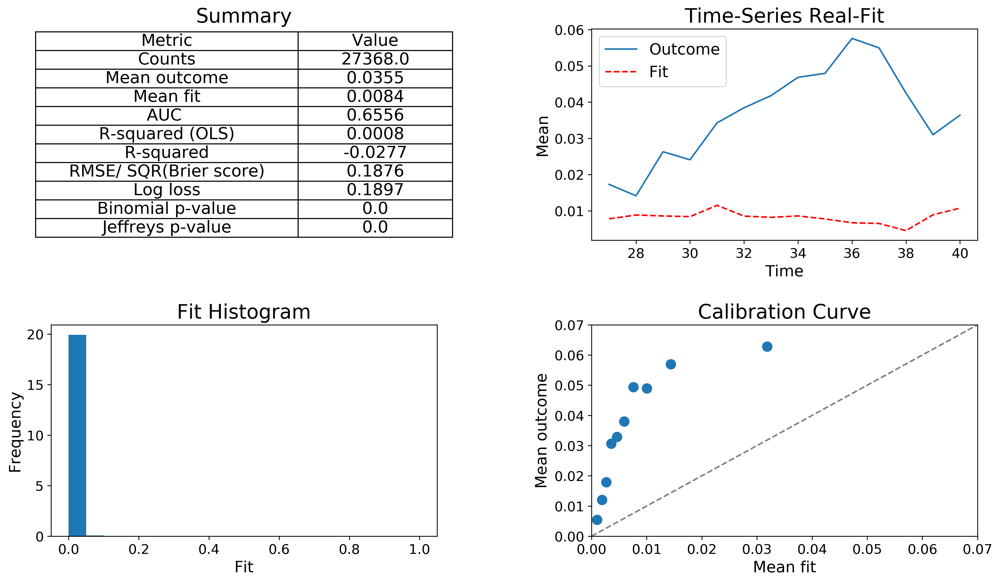

In [11]:
predictions_test = model_lr_reg1.predict_proba(X_test_scaled)[:,1].T

validation(predictions_test, y_test, data_test['time'].values)

## Logistic Regression with Regularization and Hyperparameter Tuning

In [12]:
np.random.seed(12345)

penalty = ['l1', 'l2']
C_range = [0.1, 0.2, 0.5, 0.8, 1, 2, 5]

params_lr = {'penalty': penalty, 'C': C_range}

print(params_lr)

model_lr_reg = LogisticRegression(fit_intercept=True, solver='saga', tol =1e-15, max_iter=5000)

# GridSearch
gs_lr = GridSearchCV(model_lr_reg, params_lr, verbose=2, n_jobs=2, cv=5, scoring = 'roc_auc')

gs_lr.fit(X_train_scaled, y_train)  
 
print(gs_lr.best_params_)

# Save the model to disk
filename = 'Mortgage_lr_GridSearch.sav'
pickle.dump(gs_lr, open(filename, 'wb'))

{'penalty': ['l1', 'l2'], 'C': [0.1, 0.2, 0.5, 0.8, 1, 2, 5]}
Fitting 5 folds for each of 14 candidates, totalling 70 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:  1.5min
[Parallel(n_jobs=2)]: Done  70 out of  70 | elapsed:  4.4min finished


{'C': 0.1, 'penalty': 'l1'}


In [13]:
# Load the model from disk
filename = 'Mortgage_lr_GridSearch.sav'
gs_lr = pickle.load(open(filename, 'rb'))

model_lr_best = LogisticRegression(
                        penalty = gs_lr.best_params_.get('penalty'),
                        C = gs_lr.best_params_.get('C'),
                        fit_intercept=True, solver='saga', tol =1e-15, max_iter=5000)                        
model_lr_best.fit(X_train_scaled, y_train)

print('Coefficients:', model_lr_best.coef_.round(decimals=4))
print('Intercept:', model_lr_best.intercept_.round(decimals=4))

Coefficients: [[-0.0763 -0.1403  0.2736 -0.6955  0.      0.      0.      0.      0.
  -0.0118  0.    ]]
Intercept: [-4.9579]


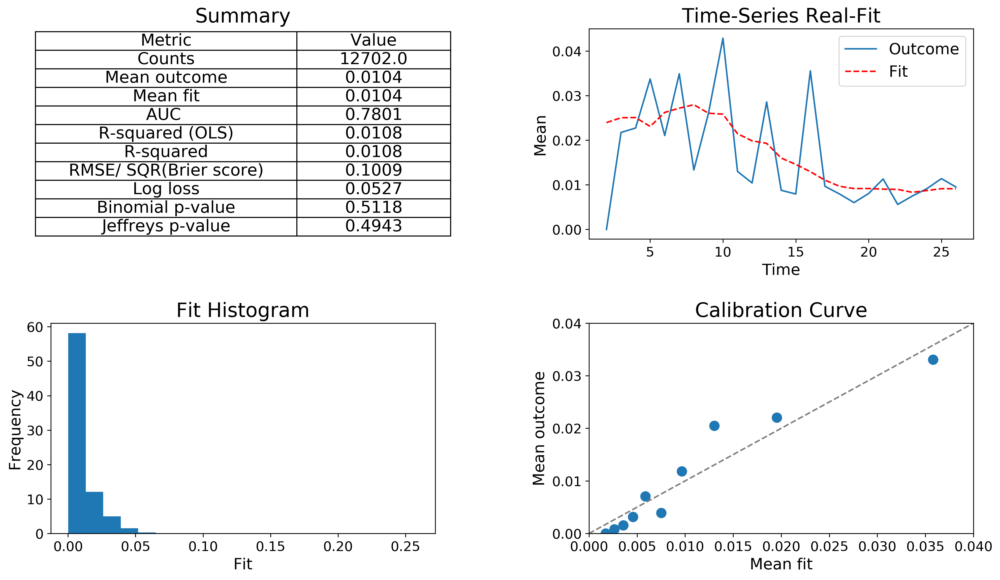

In [14]:
predictions_train = model_lr_best.predict_proba(X_train_scaled)[:,1].T

validation(predictions_train, y_train, data_train['time'].values)

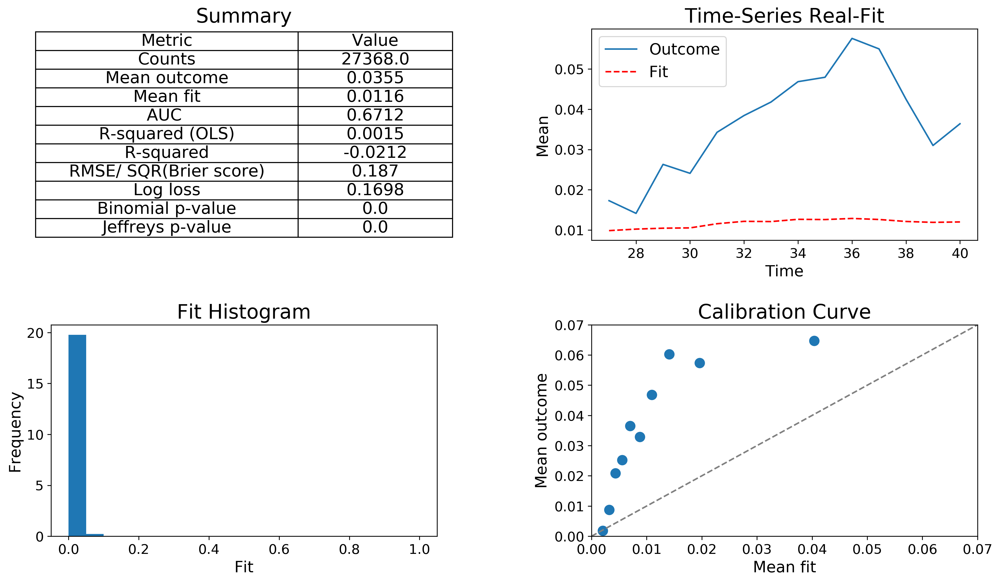

In [15]:
predictions_test = model_lr_best.predict_proba(X_test_scaled)[:,1].T

validation(predictions_test, y_test, data_test['time'].values)

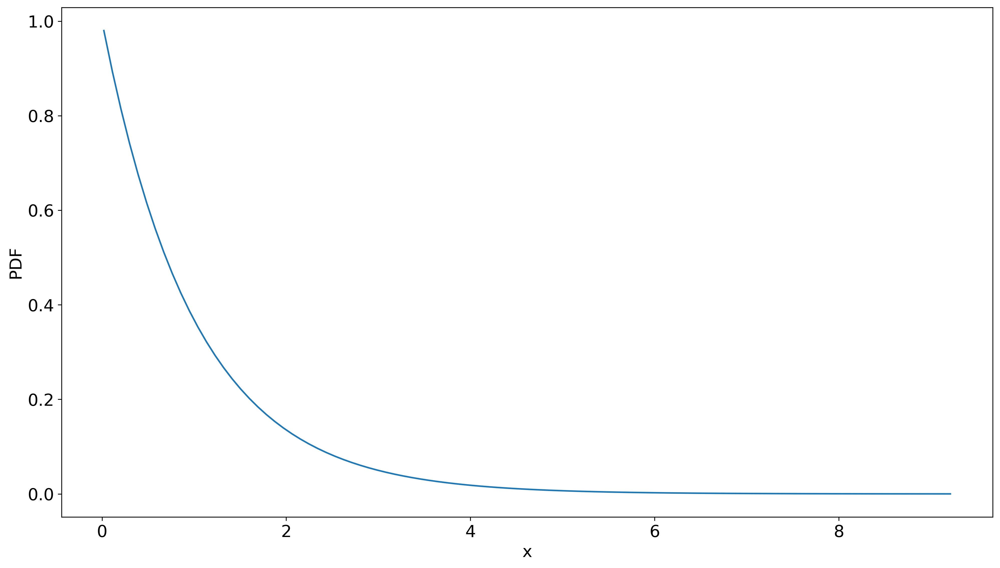

In [16]:
lambda_exp = 0.5
scale = 1/lambda_exp

x = np.linspace(expon.ppf(0.01)*scale, expon.ppf(0.99)*scale, 100)

plt.plot(x, expon.pdf(x))
plt.xlabel('x')
plt.ylabel('PDF')
plt.show()

In [17]:
np.random.seed(12345)

params_lr = {'penalty':  ['l1', 'l2'], 'C': expon(scale=0.5)}

model_lr_reg = LogisticRegression(fit_intercept=True, solver='saga', tol =1e-15, max_iter=5000)

# RandomizedSearch
rs_lr = RandomizedSearchCV(model_lr_reg, params_lr, verbose=1, n_iter=50, n_jobs=2, cv=5, scoring='roc_auc')  
rs_lr.fit(X_train_scaled, y_train)  
 
print(rs_lr.best_params_)

# Save the model to disk
filename = 'Mortgage_lr_RandomizedSearch.sav'
pickle.dump(rs_lr, open(filename, 'wb'))

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:  2.9min
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed: 10.0min
[Parallel(n_jobs=2)]: Done 250 out of 250 | elapsed: 12.0min finished


{'C': 0.025903531714783053, 'penalty': 'l1'}


In [18]:
# Load the model from disk
filename = 'Mortgage_lr_RandomizedSearch.sav'
rs_lr = pickle.load(open(filename, 'rb'))

# Refit using best parameters
model_lr_best = LogisticRegression(
                        penalty = rs_lr.best_params_.get('penalty'),
                        C = rs_lr.best_params_.get('C'),
                        fit_intercept=True, solver='saga', tol =1e-15, max_iter=5000)                        
model_lr_best.fit(X_train_scaled, y_train)

print('Coefficients:', model_lr_best.coef_.round(decimals=4))
print('Intercept:', model_lr_best.intercept_.round(decimals=4))

Coefficients: [[ 0.      0.      0.2001 -0.488   0.      0.      0.      0.      0.
   0.      0.    ]]
Intercept: [-4.759]


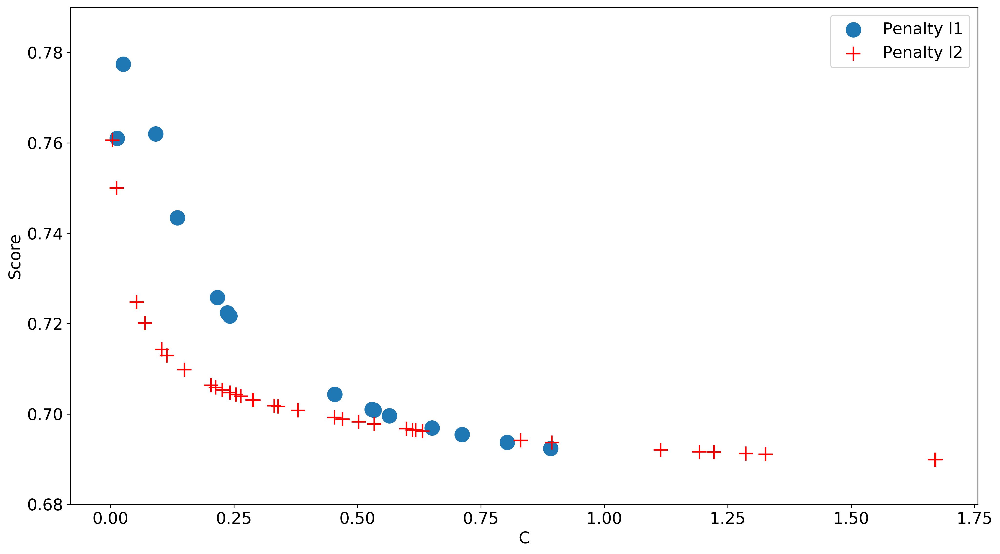

In [19]:
results = pd.DataFrame(rs_lr.cv_results_.get('params'))
results['mean_test_score'] = rs_lr.cv_results_['mean_test_score']

results_l1 = results[results['penalty']=='l1']
results_l2 = results[results['penalty']=='l2']

plt.scatter(results_l1['C'], results_l1['mean_test_score'], s=200, label = 'Penalty l1')
plt.scatter(results_l2['C'], results_l2['mean_test_score'], s=200, marker = '+', color = 'red', label = 'Penalty l2')
plt.ylabel('Score')
plt.xlabel('C')
plt.ylim(0.68, 0.79) 
plt.legend()
plt.show()

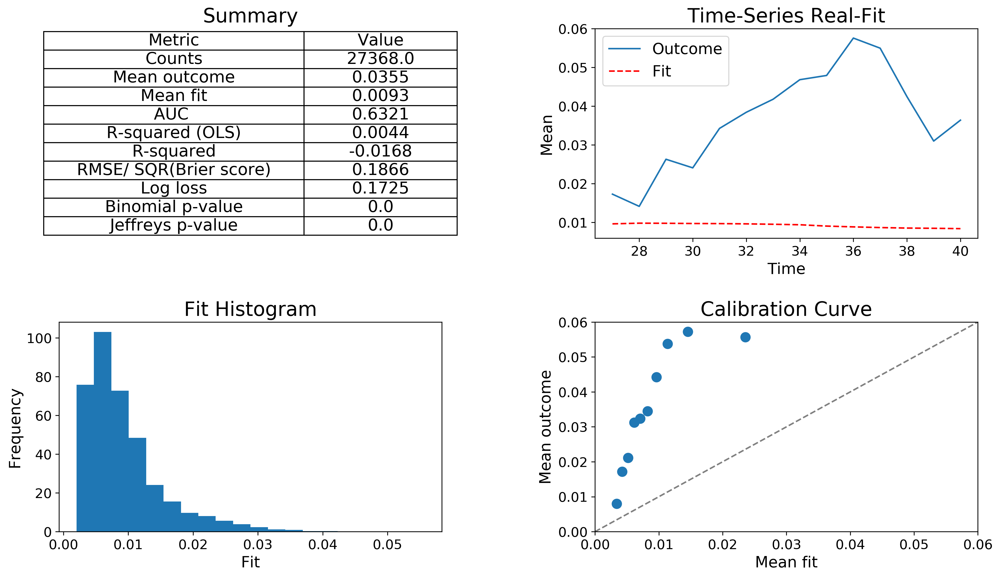

In [20]:
predictions_test = model_lr_best.predict_proba(X_test_scaled)[:,1].T

validation(predictions_test, y_test, data_test['time'].values)

# K-Nearest Neighbors

## Idea 

- Look at similar observations in terms of feature values
- Classify an observation into  majority class of the similar observations
- Requires similarity/distance measure, e.g., Minkowski metric
\begin{align*}
d(x_a,x_b) = \left[ \sum_{j=1}^p |x_{aj}-x_{bj}|^q \right]^{1/q}
\end{align*}
- Special case for $q=2$: Euclidean distance
\begin{align*}
d(x_a,x_b)& =\sqrt{(x_a-x_b)'(x_a-x_b)} \\
& = \sqrt{\sum_{j=1}^p (x_{aj}-x_{bj})^2}
\end{align*}
- Number of neighbors $k$ small: overfit
- Number of neighbors $k$ large: underfit
- Optimal number of neighbors found by crossvalidation

In [21]:
def data_generation_KNN(n0,n1):
    global X_train_scaled_knn, X_test_scaled_knn, y_train_knn, y_test_knn
    np.random.seed(1234)
    sigma=1
    mean1 = [1, 1]
    mean2 = [-1, -1]
    cov = [[1, 0], [0, 1]] 
    
    X1 = np.random.multivariate_normal(mean1, cov, n0)
    X2 = np.random.multivariate_normal(mean2, cov, n1)
    
    y1 = np.ones(n0) 
    y2 = np.ones(n1)-1 
    
    X = np.append(X1,X2, axis =0)
    y = np.append(y1,y2, axis =0)
      
    # Train-Test-Split and Scaling
    X_train_knn, X_test_knn, y_train_knn, y_test_knn = train_test_split(X, y, test_size=0.33, random_state=5)
    scaler = StandardScaler().fit(X_train_knn)
    X_train_scaled_knn = scaler.transform(X_train_knn)
    X_test_scaled_knn = scaler.transform(X_test_knn)    

In [22]:
data_generation_KNN(3,2)

print(y_train_knn, y_test_knn)

[1. 1. 0.] [0. 1.]


In [23]:
n_neighbors = 2 
model_knn = KNeighborsClassifier(n_neighbors, weights='uniform')
model_knn.fit(X_train_scaled_knn, y_train_knn)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=2, p=2,
                     weights='uniform')

In [24]:
predictions_train = model_knn.predict_proba(X_train_scaled_knn)[:,1].T
predictions_class_train = model_knn.predict(X_train_scaled_knn)

print(predictions_train, predictions_class_train, y_train_knn)

predictions_test = model_knn.predict_proba(X_test_scaled_knn)[:,1].T
predictions_class_test = model_knn.predict(X_test_scaled_knn)

print(predictions_test, predictions_class_test, y_test_knn)

[1.  1.  0.5] [1. 1. 0.] [1. 1. 0.]
[0.5 0.5] [0. 0.] [0. 1.]


In [25]:
print('In_Sample:')
print(classification_report(y_train_knn,predictions_class_train))
print(confusion_matrix(y_train_knn,predictions_class_train))
print("ROC AUC (Train):", roc_auc_score(y_train_knn, predictions_train))
print("Accuracy (Train):", accuracy_score(y_train_knn, predictions_class_train))

print('Out-of-Sample:')
print(classification_report(y_test_knn,predictions_class_test))
print(confusion_matrix(y_test_knn,predictions_class_test))
print("ROC AUC (Test):", roc_auc_score(y_test_knn, predictions_test))
print("Accuracy (Test):", accuracy_score(y_test_knn, predictions_class_test))

In_Sample:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00         1
         1.0       1.00      1.00      1.00         2

    accuracy                           1.00         3
   macro avg       1.00      1.00      1.00         3
weighted avg       1.00      1.00      1.00         3

[[1 0]
 [0 2]]
ROC AUC (Train): 1.0
Accuracy (Train): 1.0
Out-of-Sample:
              precision    recall  f1-score   support

         0.0       0.50      1.00      0.67         1
         1.0       0.00      0.00      0.00         1

    accuracy                           0.50         2
   macro avg       0.25      0.50      0.33         2
weighted avg       0.25      0.50      0.33         2

[[1 0]
 [1 0]]
ROC AUC (Test): 0.5
Accuracy (Test): 0.5


In [26]:
def KNN_dec_bound():
    global X_train_scaled_knn, X_test_scaled_knn, y_train_knn, y_test_knn
    
    # Step size in the mesh
    h = .02  
    
    x_min, x_max = X_test_scaled_knn[:, 0].min() -1, X_test_scaled_knn[:, 0].max() +1
    y_min, y_max = X_test_scaled_knn[:, 1].min() -1, X_test_scaled_knn[:, 1].max() +1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    Z = model_knn.predict(np.c_[xx.ravel(), yy.ravel()])
    
    # Put the result into a color plot
    Z = Z.reshape(xx.shape)
    
    # Print(Z)
    plt.figure()
    plt.pcolormesh(xx, yy, Z, cmap='Pastel1')
    
    # Plot also the training points
    plt.scatter(X_test_scaled_knn[:, 0], X_test_scaled_knn[:, 1], c=y_test_knn, cmap='Greys', edgecolor='k', s=50)
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()

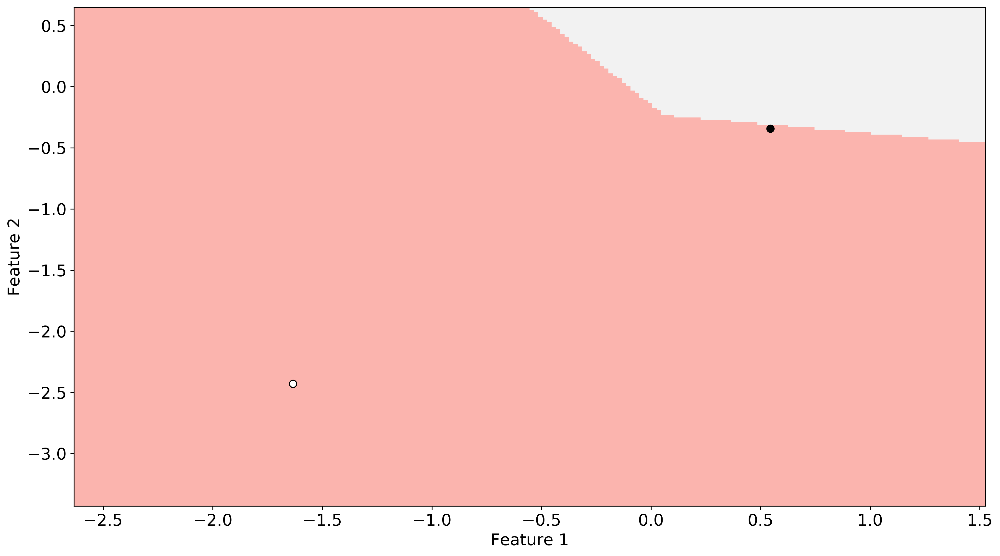

In [27]:
KNN_dec_bound()

In [28]:
data_generation_KNN(200, 100)

In [29]:
n_neighbors = 2 
model_knn = KNeighborsClassifier(n_neighbors, weights='uniform')
model_knn.fit(X_train_scaled_knn, y_train_knn)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=2, p=2,
                     weights='uniform')

In [30]:
predictions_train = model_knn.predict_proba(X_train_scaled_knn)[:,1].T
predictions_class_train = model_knn.predict(X_train_scaled_knn)

predictions_test = model_knn.predict_proba(X_test_scaled_knn)[:,1].T
predictions_class_test = model_knn.predict(X_test_scaled_knn)

In [31]:
print('In_Sample')
print(classification_report(y_train_knn, predictions_class_train))
print(confusion_matrix(y_train_knn, predictions_class_train))
print("ROC AUC (Train):", roc_auc_score(y_train_knn,  predictions_train))
print("Accuracy (Train):", accuracy_score(y_train_knn, predictions_class_train))

print('Out-of-Sample')
print(classification_report(y_test_knn, predictions_class_test))
print(confusion_matrix(y_test_knn, predictions_class_test))
print("ROC AUC (Test):", roc_auc_score(y_test_knn, predictions_test))
print("Accuracy (Test):", accuracy_score(y_test_knn, predictions_class_test))

In_Sample
              precision    recall  f1-score   support

         0.0       0.90      1.00      0.95        63
         1.0       1.00      0.95      0.97       138

    accuracy                           0.97       201
   macro avg       0.95      0.97      0.96       201
weighted avg       0.97      0.97      0.97       201

[[ 63   0]
 [  7 131]]
ROC AUC (Train): 0.9971819645732689
Accuracy (Train): 0.9651741293532339
Out-of-Sample
              precision    recall  f1-score   support

         0.0       0.79      0.92      0.85        37
         1.0       0.95      0.85      0.90        62

    accuracy                           0.88        99
   macro avg       0.87      0.89      0.87        99
weighted avg       0.89      0.88      0.88        99

[[34  3]
 [ 9 53]]
ROC AUC (Test): 0.9367916303400174
Accuracy (Test): 0.8787878787878788


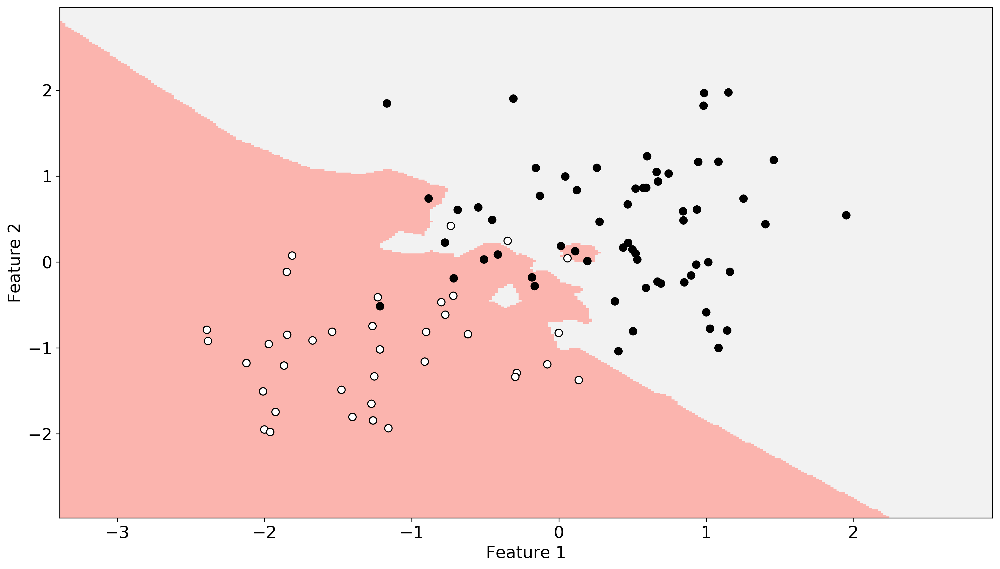

In [32]:
KNN_dec_bound()

In [33]:
n,acc_train,acc_test = [],[],[]

for i in range(1,100):
    
    model_knn = KNeighborsClassifier(i, weights='uniform')
    model_knn.fit(X_train_scaled_knn, y_train_knn)
    
    predictions_train = model_knn.predict_proba(X_train_scaled_knn)[:,1].T
    predictions_class_train = model_knn.predict(X_train_scaled_knn)
    predictions_test = model_knn.predict_proba(X_test_scaled_knn)[:,1].T
    predictions_class_test = model_knn.predict(X_test_scaled_knn)
    n.append(i)
    acc_train.append(accuracy_score(y_train_knn, predictions_class_train))
    acc_test.append(accuracy_score(y_test_knn, predictions_class_test))

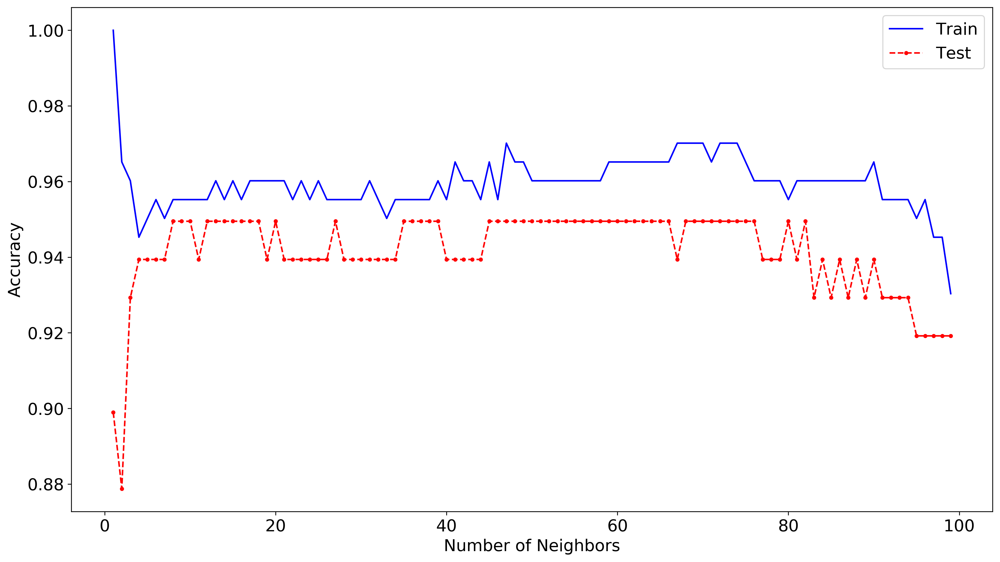

In [34]:
plt.plot(n, acc_train, marker='', linestyle='-',color='blue', label='Train')
plt.plot(n, acc_test, marker='.', linestyle='--', color='red', label='Test')
plt.ylabel('Accuracy')
plt.xlabel('Number of Neighbors')
plt.legend(loc="upper right")
plt.show()

## Practical Implementation 

In [35]:
n_neighbors = 100 
model_knn = KNeighborsClassifier(n_neighbors, weights='uniform')
model_knn.fit(X_train_scaled, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=100, p=2,
                     weights='uniform')

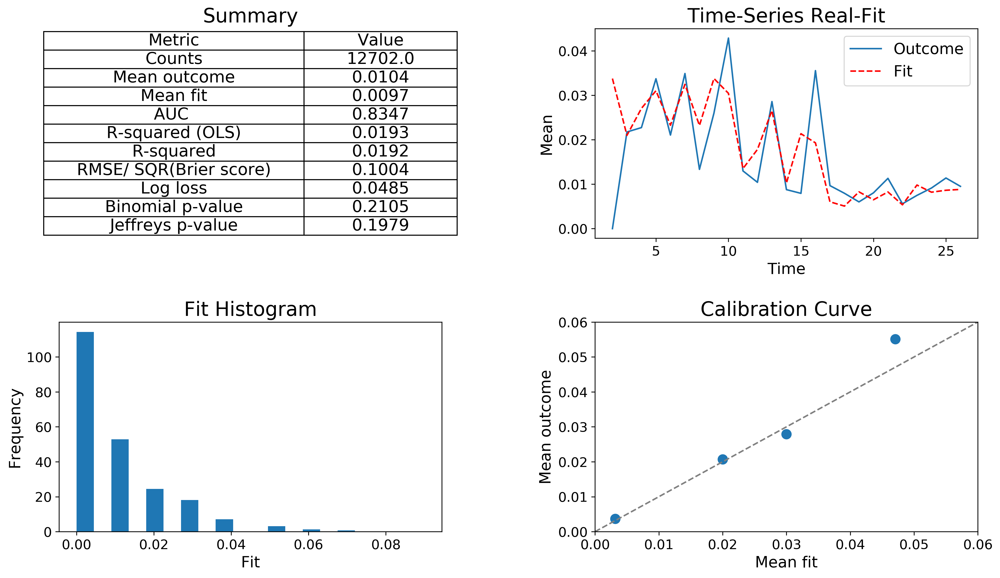

In [36]:
predictions_train = model_knn.predict_proba(X_train_scaled)[:,1].T

validation(predictions_train, y_train, data_train['time'].values)

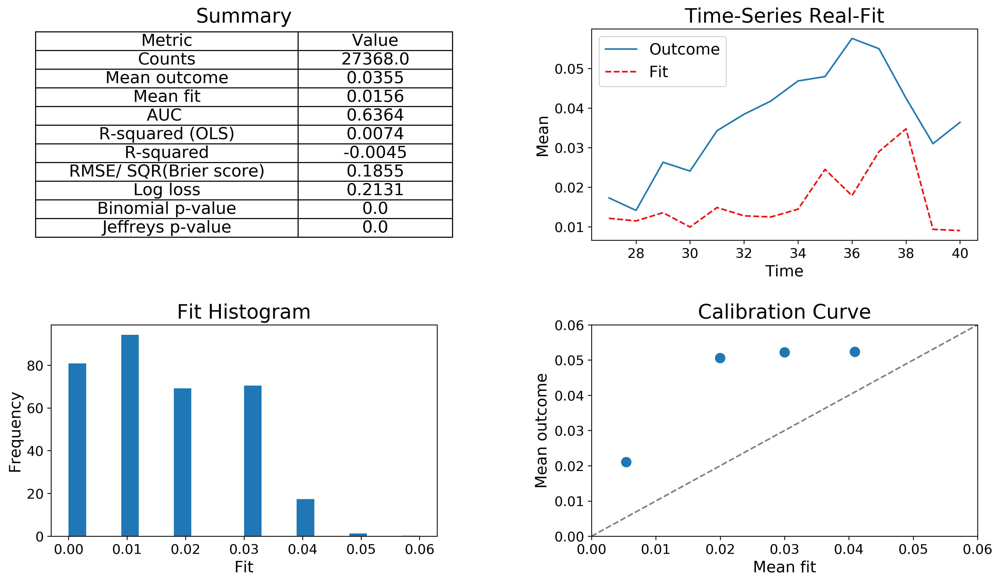

In [37]:
predictions_test = model_knn.predict_proba(X_test_scaled)[:,1].T

validation(predictions_test, y_test, data_test['time'].values)

## Hyperparameter Tuning

In [38]:
params_knn = {'n_neighbors': 2**(np.arange(0,13,1))}

print(params_knn)

model_knn_gs = KNeighborsClassifier()

gs_knn = GridSearchCV(model_knn_gs, params_knn, verbose=1, n_jobs=2, cv=5, scoring='roc_auc') 
gs_knn.fit(X_train_scaled, y_train)  
 
print(gs_knn.best_params_)

# Save the model to disk
filename = 'Mortgage_knn_GridSearch.sav'
pickle.dump(gs_knn, open(filename, 'wb'))

{'n_neighbors': array([   1,    2,    4,    8,   16,   32,   64,  128,  256,  512, 1024,
       2048, 4096], dtype=int32)}
Fitting 5 folds for each of 13 candidates, totalling 65 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:   12.7s


{'n_neighbors': 4096}


[Parallel(n_jobs=2)]: Done  65 out of  65 | elapsed:   40.9s finished


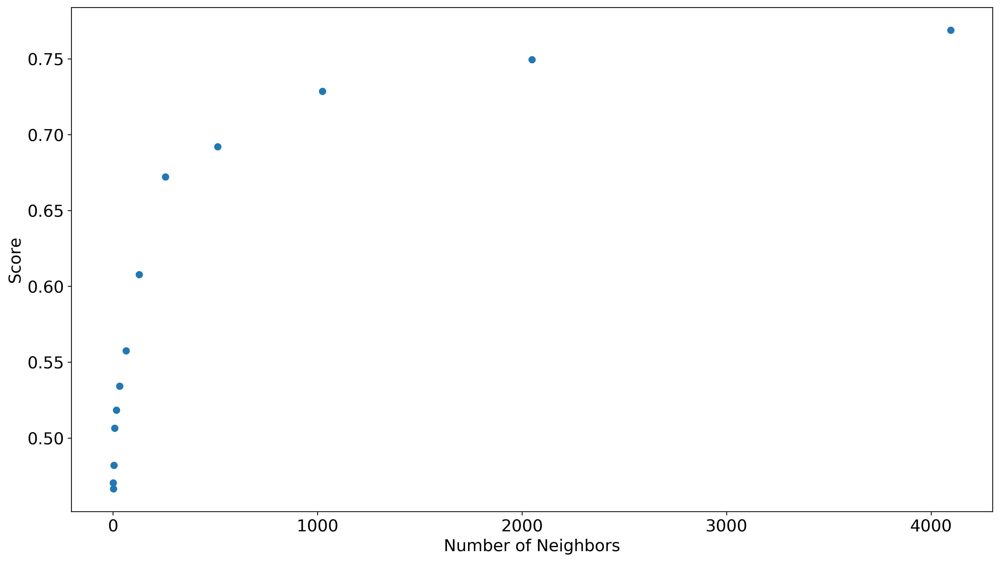

In [39]:
# Load the model from disk
filename = 'Mortgage_knn_GridSearch.sav'
gs_knn = pickle.load(open(filename, 'rb'))

plt.plot(pd.DataFrame(gs_knn.cv_results_.get('params')).iloc[:,0], gs_knn.cv_results_['mean_test_score'], marker='o', linestyle='')
plt.ylabel('Score')
plt.xlabel('Number of Neighbors')
plt.show()

In [40]:
model_knn_best = KNeighborsClassifier(n_neighbors = gs_knn.best_params_.get('n_neighbors'))                         
model_knn_best.fit(X_train_scaled, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=4096, p=2,
                     weights='uniform')

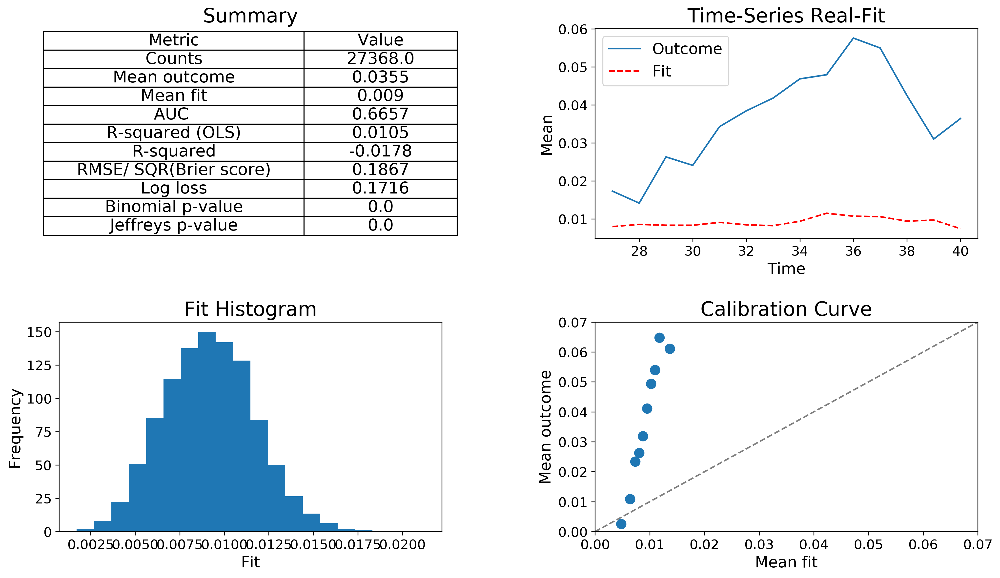

In [41]:
predictions_test = model_knn_best.predict_proba(X_test_scaled)[:,1].T

validation(predictions_test, y_test, data_test['time'].values)

# Decision Trees 

## Idea


 - Consecutively divides feature space into homogeneous sets
 
 ![Example of a Tree](Tree_Example.jpg)


## Practical Implementation 

In [42]:
model_dt = DecisionTreeClassifier(random_state=12345, max_depth=5, max_features=5)
model_dt.fit(X_train_scaled, y_train)

print(model_dt.feature_importances_.round(4))

[3.432e-01 3.363e-01 5.900e-02 1.908e-01 1.700e-02 0.000e+00 2.370e-02
 0.000e+00 2.000e-04 2.960e-02 0.000e+00]


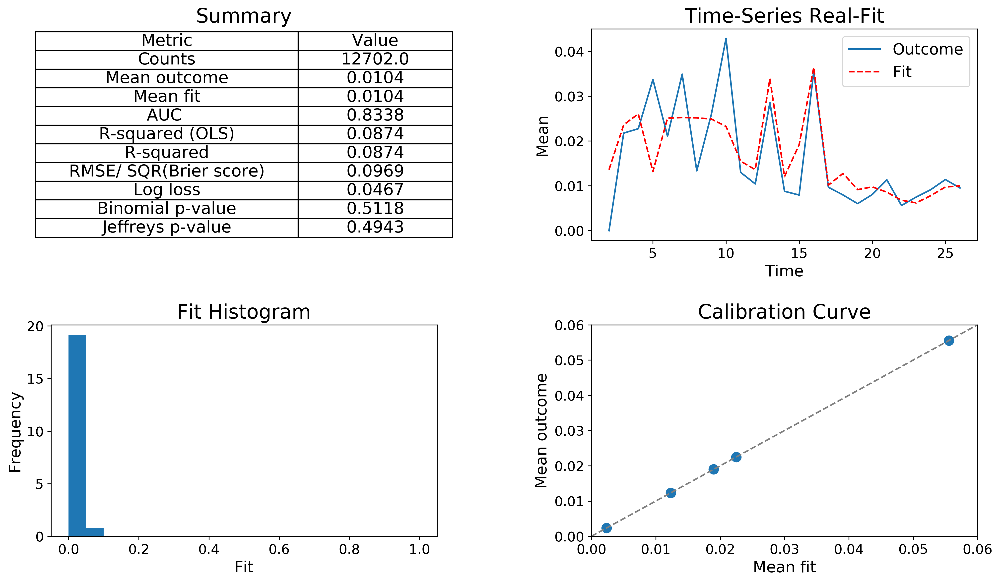

In [43]:
predictions_train = model_dt.predict_proba(X_train_scaled)[:,1].T

validation(predictions_train, y_train, data_train['time'].values)

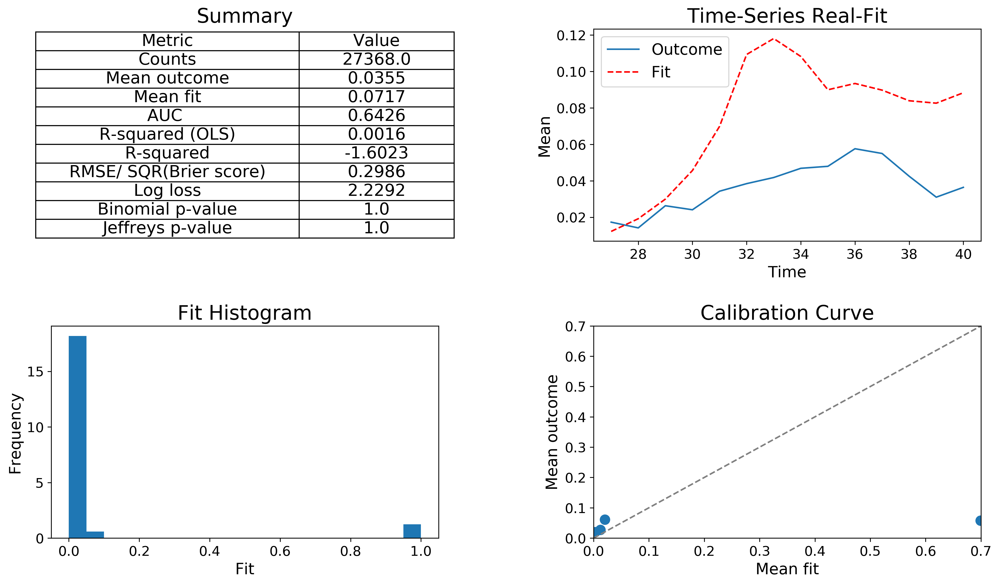

In [44]:
predictions_test = model_dt.predict_proba(X_test_scaled)[:,1].T

validation(predictions_test, y_test, data_test['time'].values)

## Hyperarameter Tuning

In [45]:
params_dt = {  
    'max_depth': np.arange(2,10,1),
    'max_features': np.arange(2,10,1)}

model_dt = DecisionTreeClassifier(random_state=12345)  
gs_dt = GridSearchCV(model_dt, params_dt, verbose=1, n_jobs=2, cv=5, scoring='roc_auc') 
gs_dt.fit(X_train_scaled, y_train)  

print(gs_dt.best_params_) 

# Save the model to disk
filename = 'Mortgage_dt_GridSearch.sav'
pickle.dump(gs_dt, open(filename, 'wb'))

Fitting 5 folds for each of 64 candidates, totalling 320 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.


{'max_depth': 4, 'max_features': 9}


[Parallel(n_jobs=2)]: Done 320 out of 320 | elapsed:    3.0s finished


In [46]:
# Load the model from disk
filename = 'Mortgage_dt_GridSearch.sav'
gs_dt = pickle.load(open(filename, 'rb'))

model_dt_best = DecisionTreeClassifier(random_state=1234, max_depth = gs_dt.best_params_.get('max_depth'),
                        max_features = gs_dt.best_params_.get('max_features') )
                         
model_dt_best.fit(X_train_scaled, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=4, max_features=9, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=1234, splitter='best')

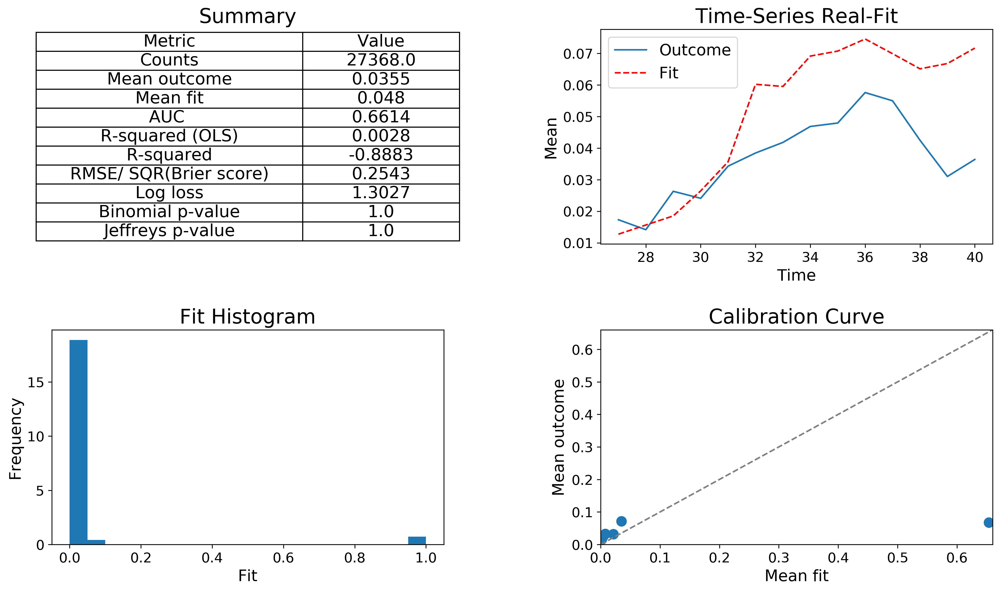

In [47]:
predictions_test = model_dt_best.predict_proba(X_test_scaled)[:,1].T

validation(predictions_test, y_test, data_test['time'].values)

## Visualization of Trees

In [48]:
model_dt_test = DecisionTreeClassifier(random_state=0, max_depth=1, max_features=11)
model_dt_test.fit(X_train_scaled, y_train)

print(model_dt_test.feature_importances_.round(4))

[0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]


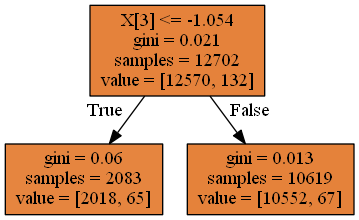

In [49]:
export_graphviz(model_dt_test,
    out_file='model_dt_test.dot',
    rounded=False, filled=True)

(graph,) = pydot.graph_from_dot_file('model_dt_test.dot')
graph.write_png('model_dt_test.png')

from IPython.display import Image 
Image(filename = 'model_dt_test.png')

# Bagging 

## Idea 

general idea of Ensemble methods:
- Fit not only one method, but rather multiple (on different data samples)
- Aggregate results (e.g., average predictions)

Bagging (Bootstrap Aggregating):
- Sample training data $b = 1,2,...,B$ randomly with replacement
- Fit model to sampled data and make predictions $\hat{f}_b(x)$
- Aggregate predictions
\begin{equation*}
\hat{f}_{\text{bag}}(x) = \frac{1}{B} \sum_{b=1}^B \hat{f}_b(x)
\end{equation*}

## Practical Implementation 

In [50]:
lr_bag = LogisticRegression(penalty='l1', fit_intercept=True, C=0.1, solver='saga', tol =1e-15, max_iter=1000)
model_lr_bag=BaggingClassifier(lr_bag, n_estimators=20, max_samples=0.8, max_features=1.0, bootstrap=True, warm_start=False, n_jobs=2, oob_score=True, random_state=0, verbose=2)
model_lr_bag.fit(X_train_scaled, y_train)

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   2 out of   2 | elapsed:    8.8s finished


BaggingClassifier(base_estimator=LogisticRegression(C=0.1, class_weight=None,
                                                    dual=False,
                                                    fit_intercept=True,
                                                    intercept_scaling=1,
                                                    l1_ratio=None,
                                                    max_iter=1000,
                                                    multi_class='auto',
                                                    n_jobs=None, penalty='l1',
                                                    random_state=None,
                                                    solver='saga', tol=1e-15,
                                                    verbose=0,
                                                    warm_start=False),
                  bootstrap=True, bootstrap_features=False, max_features=1.0,
                  max_samples=0.8, n_estimators=20, n_jobs=2, oob_s

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   2 out of   2 | elapsed:    0.0s finished


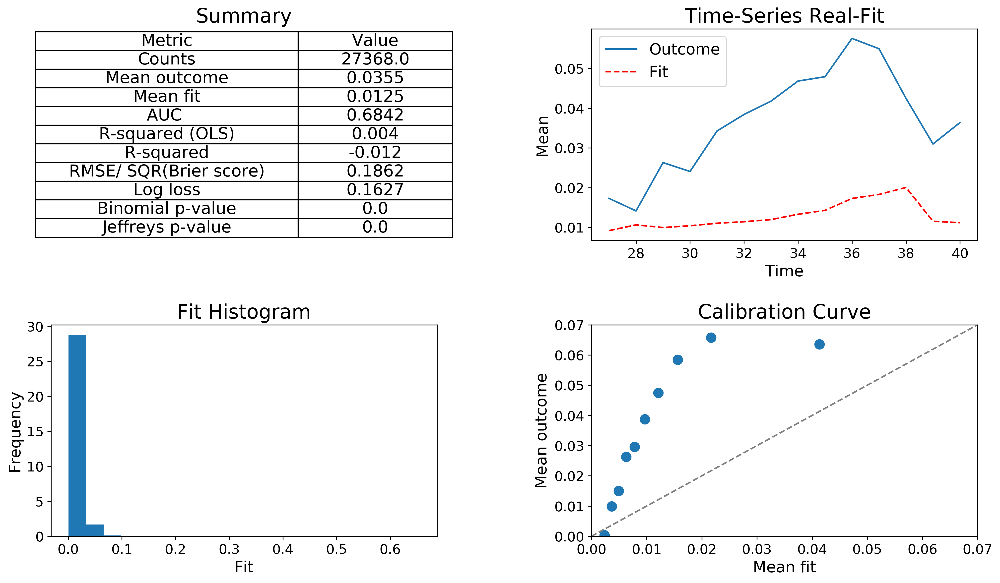

In [51]:
predictions_test = model_lr_bag.predict_proba(X_test_scaled)[:,1].T

validation(predictions_test, y_test, data_test['time'].values)

# Random Forests 

## Idea 

- **Random Forests** are bagged trees
- Meta estimators that fit a number of trees on various sub-samples of the dataset 
- Use averaging to improve the predictive accuracy and control over-fitting

## Practical Implementation

In [52]:
model_rfc = RandomForestClassifier(random_state=0, max_depth=5, warm_start=True,n_estimators=100)
model_rfc.fit(X_train_scaled, y_train)

print(model_rfc.feature_importances_.round(decimals=4) )

[0.2084 0.1828 0.2013 0.2226 0.0353 0.0291 0.0248 0.0293 0.0251 0.039
 0.0024]


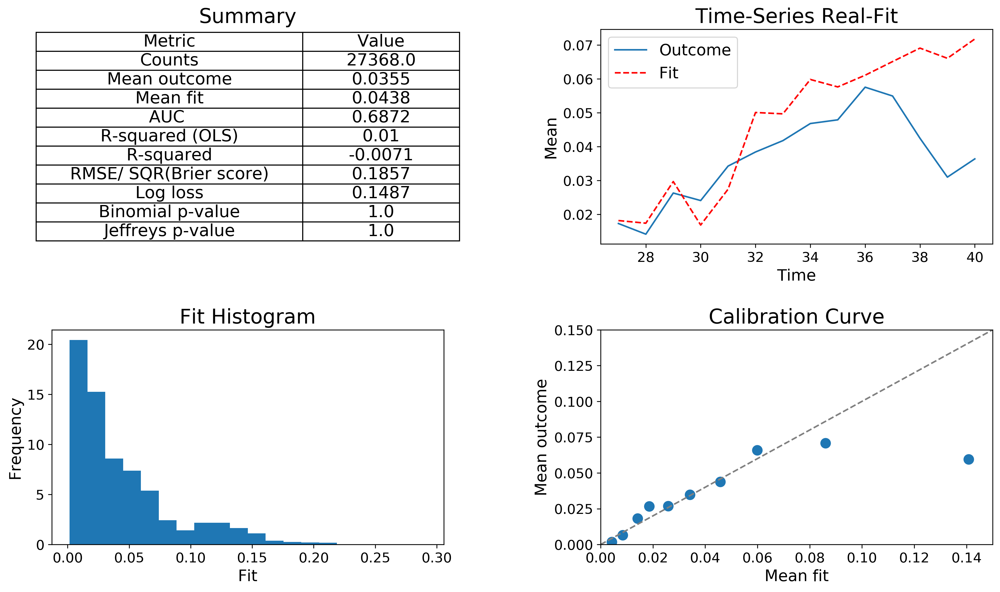

In [53]:
predictions_test = model_rfc.predict_proba(X_test_scaled)[:,1].T

validation(predictions_test, y_test, data_test['time'].values)

## Hyperparameter Tuning 

In [54]:
params_rfc = {  
    'n_estimators': sp_randint(1, 500),
    'max_depth': [2, 3, 4, 5, 10, None],
    'max_features': sp_randint(1, 10),
    'min_samples_split': sp_randint(2, 11)}

model_rfc = RandomForestClassifier()  

rs_rfc = RandomizedSearchCV(model_rfc, params_rfc, verbose=1, n_iter=50, n_jobs=2, cv=5, scoring='roc_auc')  
rs_rfc.fit(X_train_scaled, y_train)  
print(rs_rfc.best_params_) 

# save the model to disk
filename = 'Mortgage_rfc_RandomizedGridSearch.sav'
pickle.dump(rs_rfc, open(filename, 'wb'))

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:  1.9min
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:  5.3min
[Parallel(n_jobs=2)]: Done 250 out of 250 | elapsed:  6.2min finished


{'max_depth': 5, 'max_features': 9, 'min_samples_split': 9, 'n_estimators': 129}


In [55]:
filename = 'Mortgage_rfc_RandomizedGridSearch.sav'
rs_rfc = pickle.load(open(filename, 'rb'))

print(rs_rfc.best_params_) 

np.random.seed(seed=12345)
model_rfc_best =RandomForestClassifier(max_depth = rs_rfc.best_params_.get('max_depth'),
                        max_features = rs_rfc.best_params_.get('max_features'),
                        min_samples_split = rs_rfc.best_params_.get('min_samples_split'),
                        n_estimators = rs_rfc.best_params_.get('n_estimators'))
                         
model_rfc_best.fit(X_train_scaled, y_train)

print(model_rfc_best.feature_importances_.round(decimals=4)) 

{'max_depth': 5, 'max_features': 9, 'min_samples_split': 9, 'n_estimators': 129}
[0.3673 0.1844 0.1556 0.1823 0.0409 0.0138 0.007  0.0092 0.016  0.0233
 0.    ]


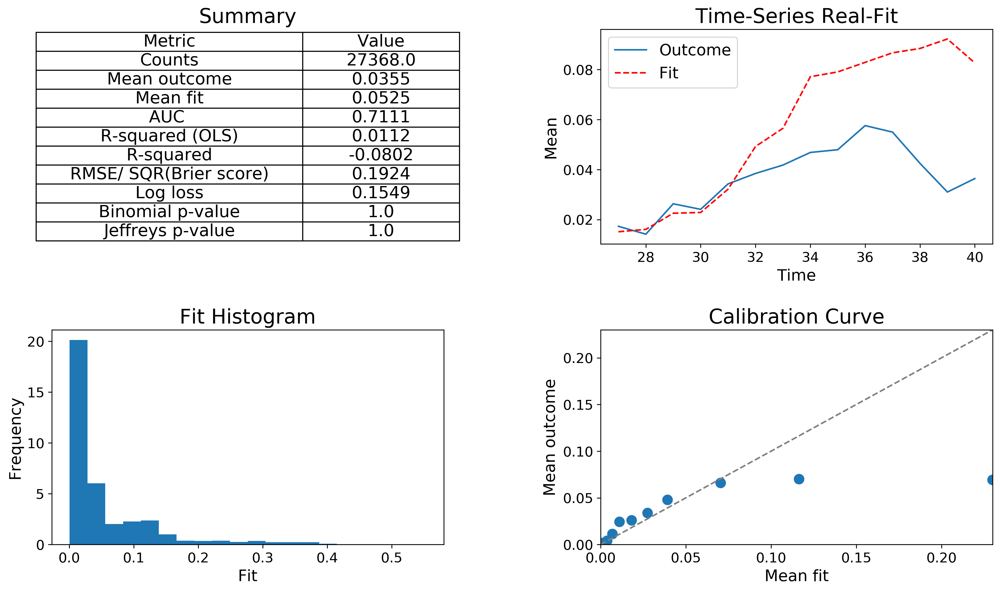

In [56]:
predictions_test = model_rfc_best.predict_proba(X_test_scaled)[:,1].T

validation(predictions_test, y_test, data_test['time'].values)

# Boosting

## Idea

 - Draw a sample from the entire data
 - Use this sample and fit a base model
 - Make predictions for the entire data and compute the prediction errors
 - Assign higher weights to the misclassified predictions
 - Draw another sample and fit a new model using the new weights
 - Continue this cycle
 - Generate the final prediction as the weighted mean from all models
      
Prominent algorithms:  Ada(ptive) Boost, (Stochastic) Gradient Boosting, Extreme Gradient Boosting (XGB), Light GBM

In regression you can think of Boosting as consecutively fitting a model on the residuals of the former model

## Practical Implementation

In [57]:
lr_boost = LogisticRegression(penalty='l2', fit_intercept=True, C=10, solver='lbfgs', tol =1e-15, max_iter=2000)
model_lr_boost=AdaBoostClassifier(lr_boost, n_estimators=50, learning_rate=0.01, random_state=2)
model_lr_boost.fit(X_train_scaled, y_train)

AdaBoostClassifier(algorithm='SAMME.R',
                   base_estimator=LogisticRegression(C=10, class_weight=None,
                                                     dual=False,
                                                     fit_intercept=True,
                                                     intercept_scaling=1,
                                                     l1_ratio=None,
                                                     max_iter=2000,
                                                     multi_class='auto',
                                                     n_jobs=None, penalty='l2',
                                                     random_state=None,
                                                     solver='lbfgs', tol=1e-15,
                                                     verbose=0,
                                                     warm_start=False),
                   learning_rate=0.01, n_estimators=50, random_state=2)

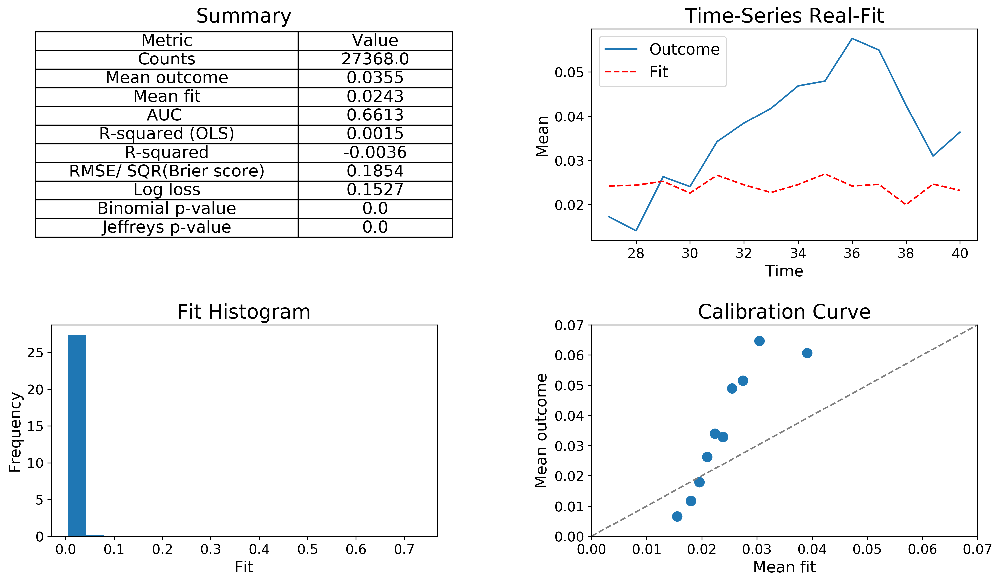

In [58]:
predictions_test = model_lr_boost.predict_proba(X_test_scaled)[:,1].T

validation(predictions_test, y_test, data_test['time'].values)

# Boosted Trees

## Summary of Approaches

 - Boosted Trees
 - Gradient Boosting
 - Light GBM


## Adaptive Boosted Trees 

In [59]:
dt_boost = DecisionTreeClassifier(random_state=12345, max_depth=3, max_features =3)
model_dt_boost=AdaBoostClassifier(dt_boost, n_estimators=500, learning_rate=0.001)
model_dt_boost.fit(X_train_scaled, y_train)
print(model_dt_boost.feature_importances_ ) 

[0.17946728 0.08078689 0.28846886 0.30354542 0.04245195 0.01586721
 0.02844283 0.00649562 0.0104968  0.04344005 0.00053707]


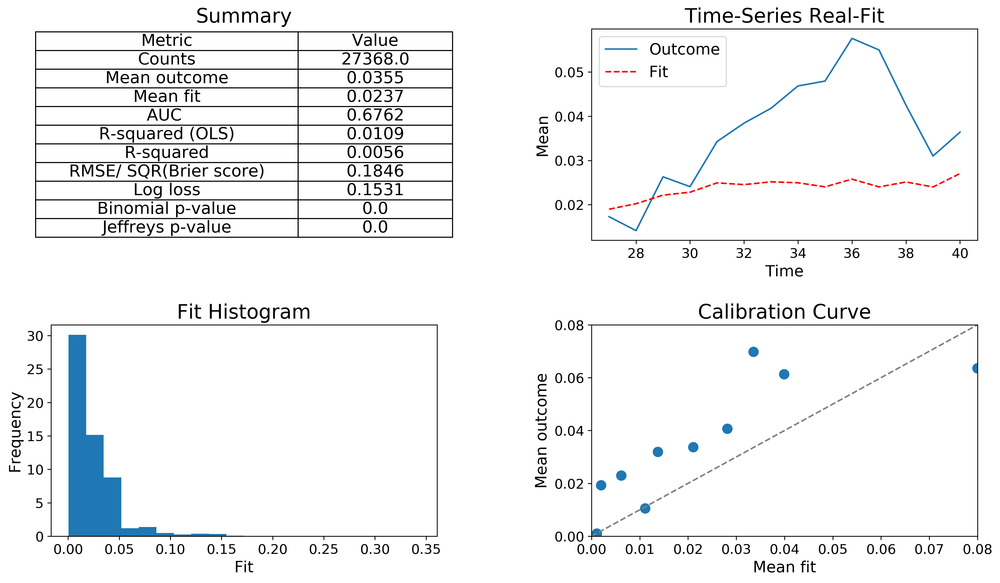

In [60]:
predictions_test = model_dt_boost.predict_proba(X_test_scaled)[:,1].T

validation(predictions_test, y_test, data_test['time'].values)

## Stochastic Gradient Boosting

In [61]:
model_dt_grboost = GradientBoostingClassifier(learning_rate=0.01, n_estimators=100, 
                                  subsample=0.5, random_state=0, max_features=None, verbose=0) 
model_dt_grboost.fit(X_train_scaled, y_train)

print(model_dt_grboost.feature_importances_ ) 

[0.29721936 0.23027015 0.16473528 0.15514333 0.08152976 0.01273939
 0.00482663 0.00498533 0.02037036 0.02818041 0.        ]


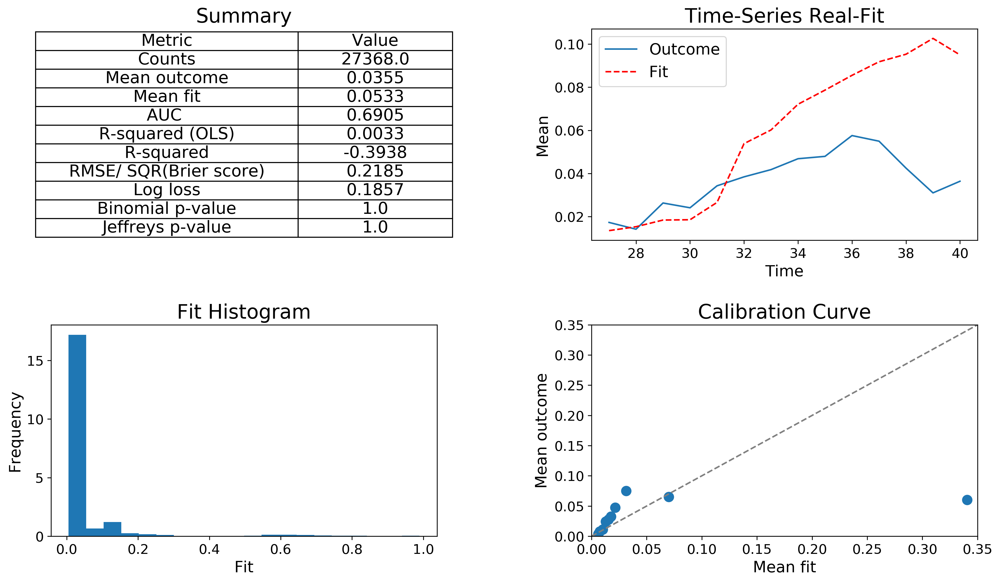

In [62]:
predictions_test = model_dt_grboost.predict_proba(X_test_scaled)[:,1].T

validation(predictions_test, y_test, data_test['time'].values)

## Light GBM 

In [64]:
from lightgbm import LGBMClassifier
model_lightgbm = LGBMClassifier(boosting_type='gbdt', num_leaves=31, max_depth=10, learning_rate=0.1, n_estimators=100, 
                                   objective='binary', subsample=0.7, random_state=0, n_jobs=2, silent=False)

model_lightgbm.fit(X_train_scaled, y_train)

print(model_lightgbm.feature_importances_ ) 

[653 585 559 556 126 101  91  95 108 125   1]


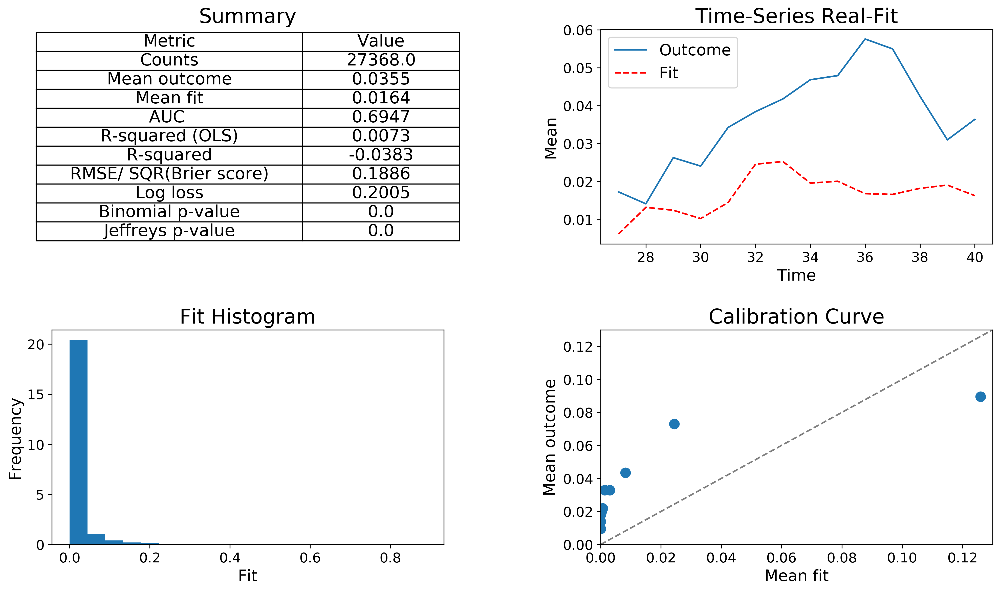

In [65]:
predictions_test = model_lightgbm.predict_proba(X_test_scaled)[:,1].T

validation(predictions_test, y_test, data_test['time'].values)

# Voting Classifier

- Combines different models to form a majority vote or mixture model 
- Majority model: several methods (estimators) are fitted and an object is finally classified into the class which is suggested by most models (so-called 'hard-vote') 

- Mixture model: probabilities computed by each model are weighted and the sum is then the basis for classification (so-called 'soft-vote') 

- Analogously if we are interested in probabilities only (and not in classification)

Application: 
- Fit Logistic Regression, Random Forest and Neural Network (see later)
- Compute soft-vote PD, which we initiate in a first step

In [66]:
clf1 = LogisticRegression(penalty='none', fit_intercept=True, C=0.1, solver='saga', tol =1e-15, max_iter=10000)
clf2 = RandomForestClassifier(random_state=0, max_depth=5, warm_start=True,n_estimators=100)
clf3 = MLPClassifier(hidden_layer_sizes=(3), random_state=2, max_iter=3000, warm_start=True, 
                         activation='relu', 
                         solver='sgd', learning_rate='adaptive', learning_rate_init=0.1, validation_fraction=0.3,
                         verbose=False, n_iter_no_change=10, early_stopping=False, alpha=0.001, shuffle=True)

In [67]:
vote_clf1 = VotingClassifier(estimators=[('lr', clf1), ('rf', clf2), ('nn', clf3)], 
    voting='soft')
vote_clf1 = vote_clf1.fit(X_train_scaled, y_train)

vote_clf2 = VotingClassifier(estimators=[('lr', clf1), ('rf', clf2), ('nn', clf3)],
    voting='soft', weights=[1,2,1],
    flatten_transform=True)
vote_clf2 = vote_clf2.fit(X_train_scaled, y_train)

print(vote_clf2.transform(X_train_scaled).shape)

(12702, 6)


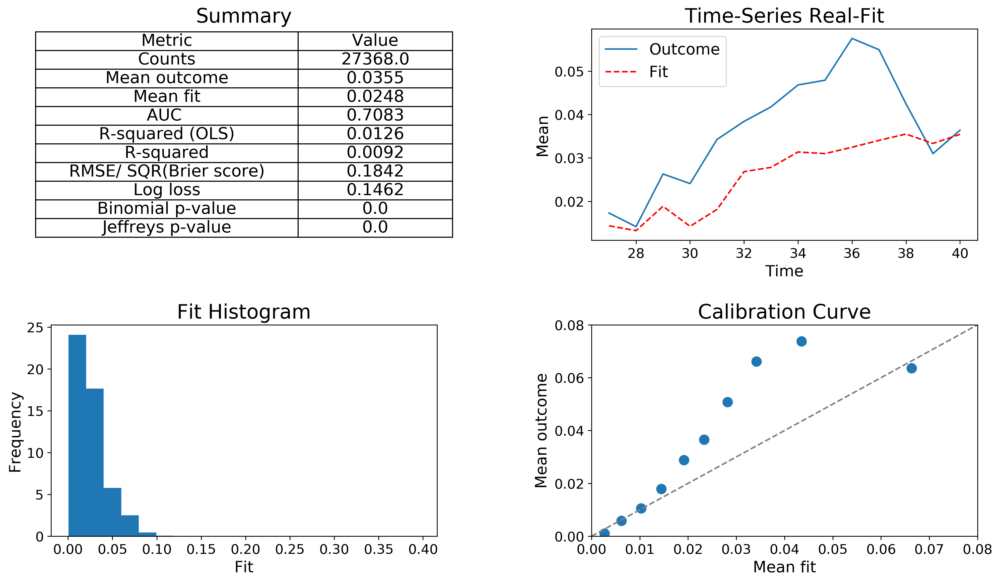

In [68]:
predictions_test =vote_clf1.predict_proba(X_test_scaled)[:,1].T

validation(predictions_test, y_test, data_test['time'].values)

# Sandbox Problems

 - Estimate a logistic regression model with `l1` regularization. Choose an appropriate feature space.
 - Build a decision tree model for the three features FICO, current LTV and interest rate at loan origination.
 - Run a randomized grid search for decision trees where you randomize the maximum number of features and the maximum depth.
 - Create a visualization of the best tree.
 - Run a systematic grid search over the penalty parameter for a support vector machine.

# Copyright and Disclaimer

Copyright: The workshop resources (handbook and codes) provided to you by Deep Credit Risk are
protected by copyright. You are not permitted to distribute or re-use the workshop materials for
commercial purposes without permission of Deep Credit Risk.

Limit of Liability/Disclaimer of Warranty: While the authors and Deep Credit Risk have used their best effort
in preparing this material, they make no representations or warranties with respect to
the accuracy or completeness of the contents and specifically disclaim any implied
warranties of merchantability or fitness for a particular purpose. No warranty may be
created or extended by sales representatives or written sales materials. The advise and
strategies contained herein may not be suitable for your situation. The authors and Deep Credit Risk shall not
be liable for any loss of profit or any other commercial damages, including but not
limited to special, incidental, consequential, or other damages.